## Real-time selective sequencing using nanopore technology. Figures and Analysis

### Introduction

Figure 1

This jupyter notebook requires the R kernel. 

Each figure from the manuscript "Real-time seletive sequencing using nanopore technology" is reproduced in this notebook. Figures are presented by panel and in the order in which they are considered in the manuscript.

In [13]:
library(ggplot2)
library("gridExtra")
library("plyr")

## Selective Enrichment of Targeted Regions of the Lambda Genome

### Figure 1A - 30b/s enrichment over the lambda genome.

Here we show enrichment over two 5 kb regions (10-15 kb and 30-35 kb) sequencing with SQK5 chemistry (30 b/s) and applying read until only to the even numbered channels.


In [3]:
system("genomeCoverageBed -ibam data/fig2/RU7/ALL/ALL_RU7_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU7/ALL/ALL_RU7_2D.txt",intern=FALSE)

system("genomeCoverageBed -ibam data/fig2/RU7/EVEN/EVEN_RU7_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU7/EVEN/EVEN_RU7_2D.txt",intern=FALSE)

system("genomeCoverageBed -ibam data/fig2/RU7/ODD/ODD_RU7_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU7/ODD/ODD_RU7_2D.txt",intern=FALSE)


system("perl data/fig3/cov_windows.pl data/fig2/RU7/ALL/ALL_RU7_2D.txt 50",intern=FALSE)

system("perl data/fig3/cov_windows.pl data/fig2/RU7/EVEN/EVEN_RU7_2D.txt 50",intern=FALSE)

system("perl data/fig3/cov_windows.pl data/fig2/RU7/ODD/ODD_RU7_2D.txt 50",intern=FALSE)


In [4]:
system("genomeCoverageBed -ibam data/fig2/RU9/EVEN/EVEN_RU9_2D.bam_out.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/EVEN/EVEN_RU9_2D_out.txt",intern=FALSE)

system("genomeCoverageBed -ibam data/fig2/RU9/ODD/ODD_RU9_2D.bam_out.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ODD/ODD_RU9_2D_out.txt",intern=FALSE)
system("perl data/fig3/cov_windows.pl data/fig2/RU9/EVEN/EVEN_RU9_2D_out.txt 50",intern=FALSE)
system("perl data/fig3/cov_windows.pl data/fig2/RU9/ODD/ODD_RU9_2D_out.txt 50",intern=FALSE)

In [5]:
EVEN_RU7_2D = read.csv("data/fig2/RU7/EVEN/EVEN_RU7_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

ODD_RU7_2D = read.csv("data/fig2/RU7/ODD/ODD_RU7_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

ALL_RU7_2D = read.csv("data/fig2/RU7/ALL/ALL_RU7_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

RU7<-cbind(EVEN_RU7_2D,ODD_RU7_2D$V3,ALL_RU7_2D$V3)
colnames(RU7) <- c("Ref", "Position","E_2D","O_2D","A_2D")

## We import a file containing the read lengths for 2D sequences in this library:
RU7_lengths = read.csv("data/fig2/RU7/ALL/2Dlengths.txt",header = FALSE,sep="\t")
RU7_lengths <- cbind(RU7_lengths,type="2D")


In [6]:
EVEN_RU9_2D_ROI = read.csv("data/fig2/RU9/EVEN/EVEN_RU9_2D_out.txt_in_50_windows.txt", header = FALSE,sep="\t")
ODD_RU9_2D_ROI = read.csv("data/fig2/RU9/ODD/ODD_RU9_2D_out.txt_in_50_windows.txt", header = FALSE,sep="\t")
RU9_ROI<-cbind(EVEN_RU9_2D_ROI,ODD_RU9_2D_ROI$V3)
colnames(RU9_ROI) <- c("Ref", "Position","E_2D","O_2D")



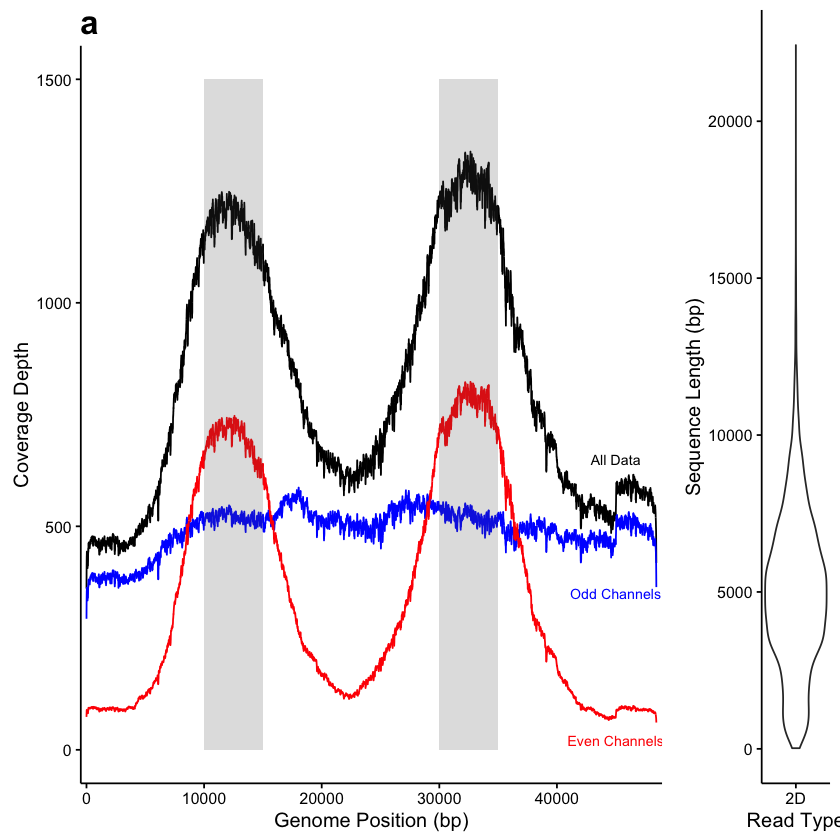

In [7]:
Fig1Ai <- ggplot(data=RU7,aes(x=Position,y=E_2D)) + theme_classic()+ geom_line(aes(x=Position,y=A_2D),size = 0.5, color="black")+geom_line(aes(x=Position,y=O_2D),size = 0.5, color="blue")+geom_line(aes(x=Position,y=E_2D),size = 0.5, color="red") + labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "a")  + annotate("text", x = 45000, y = 20, label = "Even Channels", color = "red",size=3)+ annotate("text", x = 45000, y = 350, label = "Odd Channels", color = "blue",size=3) + annotate("text", x = 45000, y = 650, label = "All Data", color = "Black",size=3) + annotate("rect", xmin = 10000, xmax = 15000,ymin=0,ymax=1500,alpha = .2) + annotate("rect", xmin = 30000, xmax = 35000,ymin=0,ymax=1500,alpha = .2) + theme(plot.title = element_text(angle = 0,hjust = 0, face="bold",size=20)) + scale_x_continuous(expand = c(0.01,0.1))
Fig1Aii<-ggplot(data=RU7_lengths,aes(x=type,y=V1))+ theme_classic()+geom_violin()+ labs(y="Sequence Length (bp)",x="Read Type")
grid.arrange(Fig1Ai,Fig1Aii,       ncol=2, nrow=1, widths=c(16, 4))

,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,type
1,31,J02459_R,5518,4915,TGATCGCCTTGCACTC,2,2115,387,Unblock,Template
2,33,J02459_R,42782,4988,GCAAATCGTTAACGGC,2,2115,387,Unblock,Template
3,35,J02459_F,19191,5061,GGGGTTCGCCGCGTCG,2,2115,387,Unblock,Template
4,37,J02459_F,27431,4981,ACTGCTATCTTCTTAC,2,2115,387,Unblock,Template
5,103,J02459_R,3369,4958,TACTGATAGAACAAAT,2,2115,387,Unblock,Template
6,105,J02459_R,2388,4915,GCCGCGTTCGCCAGCT,2,2115,387,Unblock,Template


,Ref,Position,EVEN,ODD,ALL
1,simref,0,5,0,5
2,simref,1,5,0,5
3,simref,2,5,0,5
4,simref,3,5,1,6
5,simref,4,5,1,6
6,simref,5,5,1,6


[1] 62874017

[1] 31480006

[1] 31394011

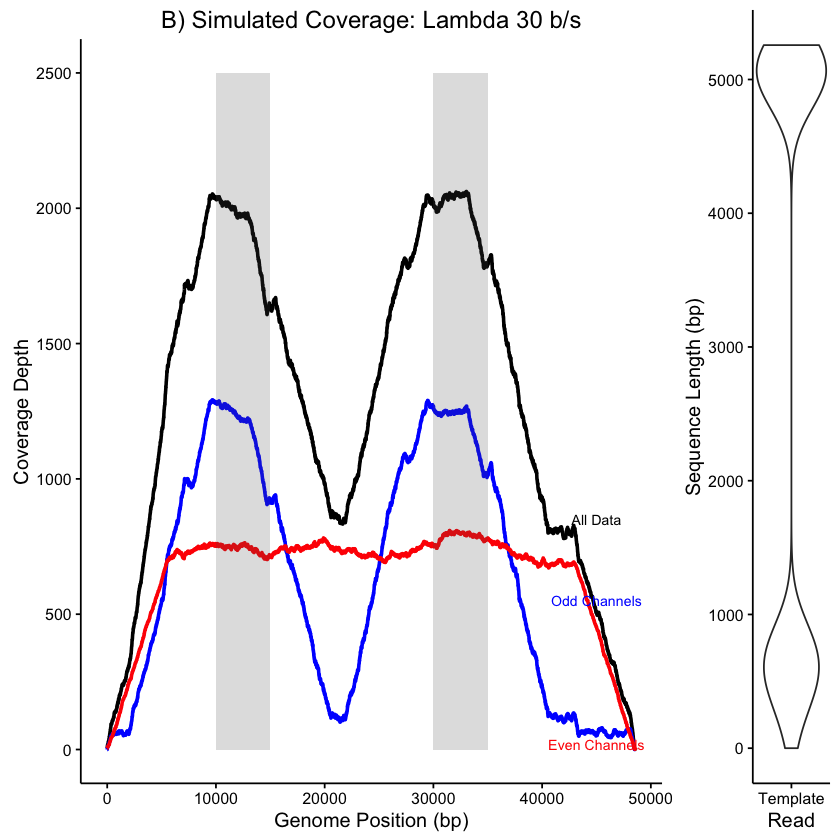

In [8]:
rawdata = read.csv("data/simulations/lambda_shortreads_15s_250m_5kb.log", header = TRUE, sep=",")


rawdata$type<-"Template"
head (rawdata)
#ggplot(data=rawdata,aes(x=type,y=read_event_count))+geom_violin()+ labs(y="Sequence Length (bp)",x="Read Type")



#EVEN2_SIM_1D_ROI = read.csv("data/simulations/512_2_5kb_FR_ru2_15s_250m_EVEN.txt", header = FALSE,sep="\t")
#ODD2_SIM_1D_ROI = read.csv("data/simulations/512_2_5kb_FR_ru2_15s_250m_ODD.txt", header = FALSE,sep="\t")
#ALL2_SIM_1D_ROI = read.csv("data/simulations/512_2_5kb_FR_ru2_15s_250m_ALL.txt", header = FALSE,sep="\t")

EVEN2_SIM_1D_ROI = read.csv("data/simulations/TESTINGMATTT_EVEN.txt", header = FALSE,sep="\t")
ODD2_SIM_1D_ROI = read.csv("data/simulations/TESTINGMATTT_ODD.txt", header = FALSE,sep="\t")
ALL2_SIM_1D_ROI = read.csv("data/simulations/TESTINGMATTT_ALL.txt", header = FALSE,sep="\t")



SIM_ROI2<-cbind(EVEN2_SIM_1D_ROI,ODD2_SIM_1D_ROI$V3,ALL2_SIM_1D_ROI$V3)
colnames(SIM_ROI2) <- c("Ref", "Position","EVEN","ODD","ALL")
head(SIM_ROI2)

#ggplot(data=SIM_ROI2,aes(x=Position,y=ALL )) + theme_bw()+ geom_line(aes(x=Position,y=ALL),size = 1, color="black")+geom_line(aes(x=Position,y=ODD),size = 1, color="blue")+geom_line(aes(x=Position,y=EVEN),size = 1, color="red") + labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "D) Simulated Coverage: Lambda 30 b/s")  + annotate("text", x = 45000, y = 20, label = "Even Channels", color = "red",size=3)+ annotate("text", x = 45000, y = 550, label = "Odd Channels", color = "blue",size=3) + annotate("text", x = 45000, y = 850, label = "All Data", color = "Black",size=3) + annotate("rect", xmin = 10000, xmax = 15000,ymin=0,ymax=2500,alpha = .2) + annotate("rect", xmin = 30000, xmax = 35000,ymin=0,ymax=2500,alpha = .2)



sum(SIM_ROI2$ALL)
sum(SIM_ROI2$EVEN)
sum(SIM_ROI2$ODD)



Fig1Bi<-ggplot(data=SIM_ROI2,aes(x=Position,y=ALL )) + theme_classic()+ geom_line(aes(x=Position,y=ALL),size = 1, color="black")+geom_line(aes(x=Position,y=ODD),size = 1, color="blue")+geom_line(aes(x=Position,y=EVEN),size = 1, color="red") + labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "B) Simulated Coverage: Lambda 30 b/s")  + annotate("text", x = 45000, y = 20, label = "Even Channels", color = "red",size=3)+ annotate("text", x = 45000, y = 550, label = "Odd Channels", color = "blue",size=3) + annotate("text", x = 45000, y = 850, label = "All Data", color = "Black",size=3) + annotate("rect", xmin = 10000, xmax = 15000,ymin=0,ymax=2500,alpha = .2) + annotate("rect", xmin = 30000, xmax = 35000,ymin=0,ymax=2500,alpha = .2)
Fig1Bii<-ggplot(data=rawdata,aes(x=type,y=read_event_count))+theme_classic()+geom_violin()+ labs(y="Sequence Length (bp)",x="Read")
grid.arrange(Fig1Bi,Fig1Bii,       ncol=2, nrow=1, widths=c(16, 4))




In [5]:
simdata = read.csv("data/simulations/512_2_5kb_FR_ru2.log", header = TRUE,sep=",")

simdata$start<-simdata$seq_index
simdata$start[simdata$seq_name == "J02459_R"]<- 48503-simdata$seq_index[simdata$seq_name == "J02459_R"]
simdata$type<-"EvenRU"
simdata$type[simdata$channel_name %% 2 == 0]<- "OddNoRU"


head(simdata)


subsetmergedata <- simdata[which(simdata$start>=12250 & simdata$start<=12750),]
subsetmergedata2 <- simdata[which(simdata$start>=32250 & simdata$start<=32750),]

head(subsetmergedata)

eventotal <- simdata[which(simdata$type=="EvenRU"),]
oddtotal <- simdata[which(simdata$type=="OddNoRU"),]



evensubset <- subsetmergedata[which(subsetmergedata$type=="EvenRU"),]
oddsubset <- subsetmergedata[which(subsetmergedata$type=="OddNoRU"),]


evensubset2 <- subsetmergedata2[which(subsetmergedata2$type=="EvenRU"),]
oddsubset2 <- subsetmergedata2[which(subsetmergedata2$type=="OddNoRU"),]

sum(eventotal$read_event_count)
sum(oddtotal$read_event_count)

sum(evensubset$read_event_count)
sum(oddsubset$read_event_count)

sum(evensubset$read_event_count)/sum(oddsubset$read_event_count)

sum(evensubset2$read_event_count)
sum(oddsubset2$read_event_count)

sum(evensubset2$read_event_count)/sum(oddsubset2$read_event_count)

#Total Even
sum(sum(evensubset$read_event_count),sum(evensubset2$read_event_count))

#Total Odd
sum(sum(oddsubset$read_event_count),sum(oddsubset2$read_event_count))

#Fold Enrichment
sum(sum(evensubset$read_event_count),sum(evensubset2$read_event_count))/sum(sum(oddsubset$read_event_count),sum(oddsubset2$read_event_count))


(sum(sum(evensubset$read_event_count),sum(evensubset2$read_event_count))/sum(eventotal$read_event_count))/(sum(sum(oddsubset$read_event_count),sum(oddsubset2$read_event_count))/sum(oddtotal$read_event_count))



,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,start,type
1,33,J02459_R,41176,4051,TCAAGCTCCTCTTTCA,2,2135,293,Unblock,7327,EvenRU
2,35,J02459_F,16541,4096,GCGCTGTATGCCGGTA,2,2135,293,Unblock,16541,EvenRU
3,37,J02459_F,34546,3983,GAGAACCATGTATATG,2,2135,293,Unblock,34546,EvenRU
4,91,J02459_F,6108,4054,TGCGGCTTTTTTTACG,2,2135,293,Unblock,6108,EvenRU
5,93,J02459_R,19086,4019,AAACGATACTTGCCCT,2,2135,293,Unblock,29417,EvenRU
6,95,J02459_F,19519,4023,GAAGGCTCCGGCAGTG,2,2135,293,Unblock,19519,EvenRU


,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,start,type
549,146,J02459_R,35963,3960,CATATTCTGTGCAATA,2,2135,4027,Natural,12540,OddNoRU
587,448,J02459_R,35911,3977,CGGAACGGGTGAAGCT,2,2135,4044,Natural,12592,OddNoRU
601,77,J02459_F,12384,4004,AGAAAAAGACCTGGGC,2,2135,4071,Natural,12384,EvenRU
649,358,J02459_R,36036,3979,TCTTCCCACTCACTCC,2,2135,4046,Natural,12467,OddNoRU
751,300,J02459_F,12362,4049,CTGAATAACGTCATGT,2,2135,4116,Natural,12362,OddNoRU
785,313,J02459_R,36232,4062,CAATGGCGGCCCGTTT,2,2135,4129,Natural,12271,EvenRU


[1] 29038746

[1] 29152301

[1] 794367

[1] 325328

[1] 2.441742

[1] 838616

[1] 365447

[1] 2.294768

[1] 1632983

[1] 690775

[1] 2.363987

[1] 2.373231

### Figure 1C - 70b/s enrichment over the lambda genome.

Here we show enrichment over two 5 kb regions (10-15 kb and 35-40 kb) sequencing with SQK6 chemistry (70 b/s) and applying read until only to the even numbered channels.



In [11]:

system("genomeCoverageBed -ibam data/fig2/RU9/ALL/ALL2Dsorted.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ALL/ALL_RU9_2D.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/ALL/ALL_RU9_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ALL/ALL_RU9_2D.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/ALL/ALLComplementsorted.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ALL/ALL_RU9_Complement.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/ALL/ALLTemplatesorted.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ALL/ALL_RU9_Template.txt",intern=FALSE)

system("genomeCoverageBed -ibam data/fig2/RU9/EVEN/EVEN_RU9_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/EVEN/EVEN_RU9_2D.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/EVEN/EVEN_RU9_Complement.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/EVEN/EVEN_RU9_Complement.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/EVEN/EVEN_RU9_Template.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/EVEN/EVEN_RU9_Template.txt",intern=FALSE)


system("genomeCoverageBed -ibam data/fig2/RU9/ODD/ODD_RU9_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ODD/ODD_RU9_2D.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/ODD/ODD_RU9_Complement.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ODD/ODD_RU9_Complement.txt",intern=FALSE)
#system("genomeCoverageBed -ibam data/fig2/RU9/ODD/ODD_RU9_Template.bam -g data/fig2/lambda.genome -d > data/fig2/RU9/ODD/ODD_RU9_Template.txt",intern=FALSE)


system("perl data/fig3/cov_windows.pl data/fig2/RU9/ALL/ALL_RU9_2D.txt 50",intern=FALSE)
#system("perl data/fig3/cov_windows.pl data/fig2/RU9/ALL/ALL_RU9_Complement.txt 50",intern=FALSE)
#system("perl data/fig3/cov_windows.pl data/fig2/RU9/ALL/ALL_RU9_Template.txt 50",intern=FALSE)

system("perl data/fig3/cov_windows.pl data/fig2/RU9/EVEN/EVEN_RU9_2D.txt 50",intern=FALSE)
#system("perl data/fig3/cov_windows.pl data/fig2/RU9/EVEN/EVEN_RU9_Complement.txt 50",intern=FALSE)
#system("perl data/fig3/cov_windows.pl data/fig2/RU9/EVEN/EVEN_RU9_Template.txt 50",intern=FALSE)

system("perl data/fig3/cov_windows.pl data/fig2/RU9/ODD/ODD_RU9_2D.txt 50",intern=FALSE)
#system("perl data/fig3/cov_windows.pl data/fig2/RU9/ODD/ODD_RU9_Complement.txt 50",intern=FALSE)
#system("perl data/fig3/cov_windows.pl data/fig2/RU9/ODD/ODD_RU9_Template.txt 50",intern=FALSE)


In [22]:
#EVEN_RU9_Template = read.csv("data/fig2/RU9/EVEN/EVEN_RU9_Template.txt_in_50_windows.txt", header = FALSE,sep="\t")
#EVEN_RU9_Complement = read.csv("data/fig2/RU9/EVEN/EVEN_RU9_Complement.txt_in_50_windows.txt", header = FALSE,sep="\t")
EVEN_RU9_2D = read.csv("data/fig2/RU9/EVEN/EVEN_RU9_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

#ODD_RU9_Template = read.csv("data/fig2/RU9/ODD/ODD_RU9_Template.txt_in_50_windows.txt", header = FALSE,sep="\t")
#ODD_RU9_Complement = read.csv("data/fig2/RU9/ODD/ODD_RU9_Complement.txt_in_50_windows.txt", header = FALSE,sep="\t")
ODD_RU9_2D = read.csv("data/fig2/RU9/ODD/ODD_RU9_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

#ALL_RU9_Template = read.csv("data/fig2/RU9/ALL/ALL_RU9_Template.txt_in_50_windows.txt", header = FALSE,sep="\t")
#ALL_RU9_Complement = read.csv("data/fig2/RU9/ALL/ALL_RU9_Complement.txt_in_50_windows.txt", header = FALSE,sep="\t")
ALL_RU9_2D = read.csv("data/fig2/RU9/ALL/ALL_RU9_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

RU9<-cbind(EVEN_RU9_2D,ODD_RU9_2D$V3,ALL_RU9_2D$V3)
colnames(RU9) <- c("Ref", "Position","E_2D","O_2D","A_2D")

## We import a file containing the read lengths for 2D sequences in this library:
RU9_lengths = read.csv("data/fig2/RU9/ALL/2Dlengths.txt",header = FALSE,sep="\t")
RU9_lengths <- cbind(RU9_lengths,type="2D")

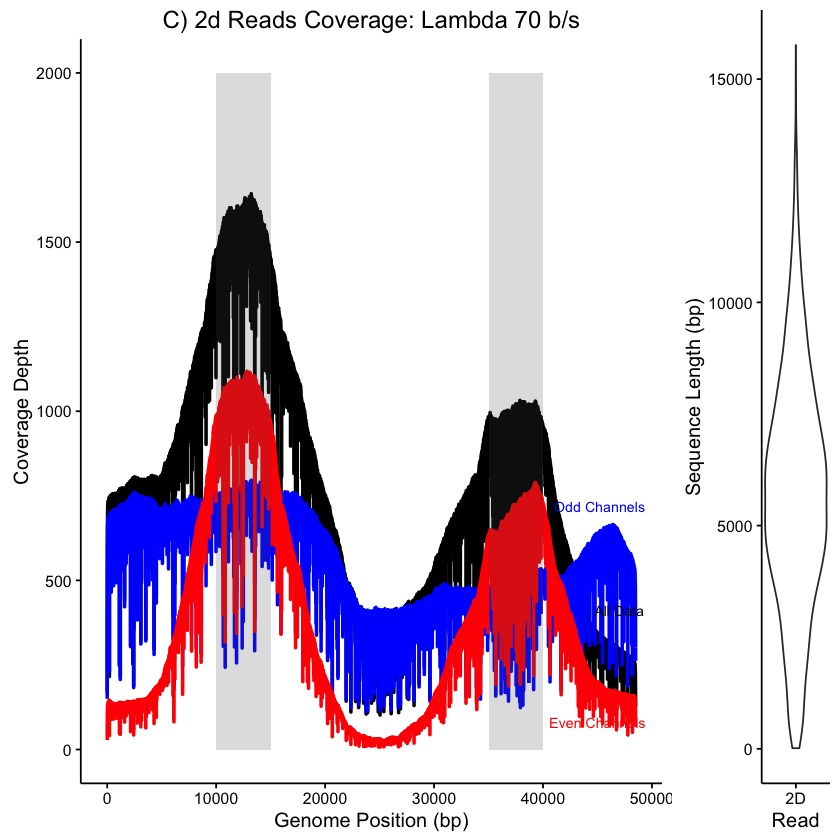

In [9]:
Fig1Ci<-ggplot(data=RU9,aes(x=Position,y=E_2D)) + theme_classic() +geom_line(aes(x=Position,y=A_2D),size = 1, color="black")+geom_line(aes(x=Position,y=O_2D),size = 1, color="blue")+geom_line(aes(x=Position,y=E_2D),size = 1, color="red") + labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "C) 2d Reads Coverage: Lambda 70 b/s") + annotate("text", x = 45000, y = 80, label = "Even Channels", color = "red",size=3)+ annotate("text", x = 45200, y = 720, label = "Odd Channels", color = "blue",size=3) + annotate("text", x = 47000, y = 410, label = "All Data", color = "Black",size=3) + annotate("rect", xmin = 10000, xmax = 15000,ymin=0,ymax=2000,alpha = .2) + annotate("rect", xmin = 35000, xmax = 40000,ymin=0,ymax=2000,alpha = .2)
Fig1Cii<-ggplot(data=RU9_lengths,aes(x=type,y=V1))+ theme_classic()+geom_violin()+ labs(y="Sequence Length (bp)",x="Read")
grid.arrange(Fig1Ci,Fig1Cii,       ncol=2, nrow=1, widths=c(16, 4))


### Figure 1D - 70b/s enrichment over the lambda genome - single peak.

Here we show enrichment over one 10 kb regions (15-25 kb) sequencing with SQK6 chemistry (70 b/s) and applying read until to all the channels.


In [10]:
system("genomeCoverageBed -ibam data/fig2/RU11/ALL_RU11_2D.bam -g data/fig2/lambda.genome -d > data/fig2/RU11/ALL_RU11_2D.txt",intern=FALSE)
system("perl data/fig3/cov_windows.pl data/fig2/RU11/ALL_RU11_2D.txt 50",intern=FALSE)


In [11]:
ALL_RU11_2D = read.csv("data/fig2/RU11/ALL_RU11_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")

RU11<-cbind(ALL_RU11_2D)
colnames(RU11) <- c("Ref", "Position","R2D")
RU11_lengths = read.csv("data/fig2/RU11/2Dlengths.txt",header = FALSE,sep="\t")
RU11_lengths <- cbind(RU11_lengths,type="2D")

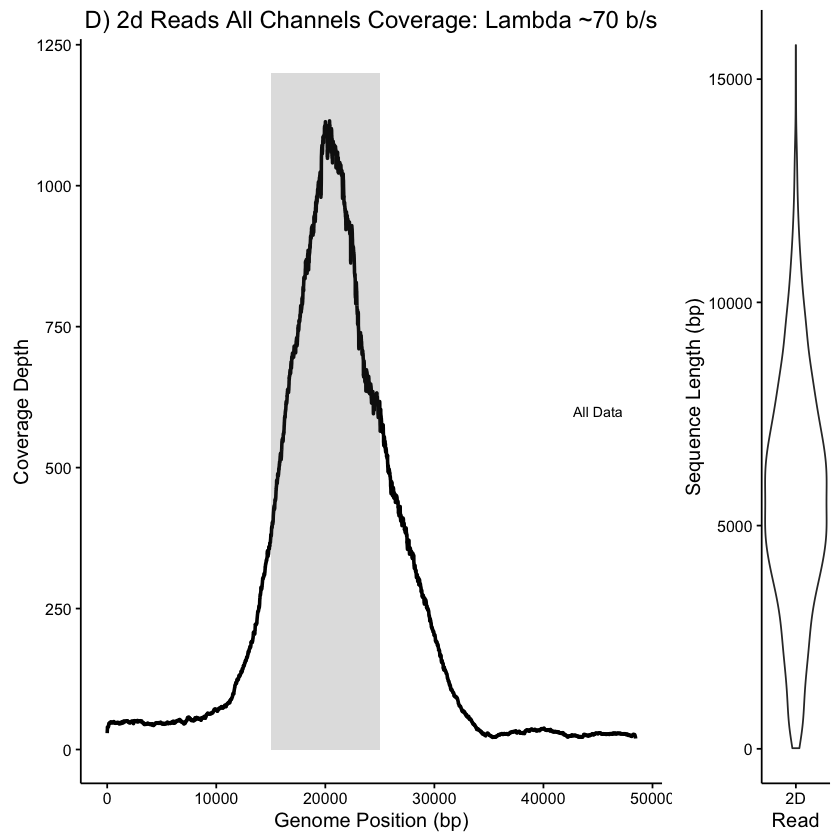

In [12]:
Fig1Ci<-ggplot(data=RU11,aes(x=Position,y=R2D)) + theme_classic() +geom_line(aes(x=Position,y=R2D),size = 1, color="black") + labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "D) 2d Reads All Channels Coverage: Lambda ~70 b/s")  + annotate("rect", xmin = 15000, xmax = 25000,ymin=0,ymax=1200,alpha = .2)+ annotate("text", x = 45000, y = 600, label = "All Data", color = "Black",size=3)
Fig1Cii<-ggplot(data=RU11_lengths,aes(x=type,y=V1))+theme_classic()+geom_violin()+ labs(y="Sequence Length (bp)",x="Read")
grid.arrange(Fig1Ci,Fig1Cii,       ncol=2, nrow=1, widths=c(16, 4))